In [455]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import h5py
import scipy.stats as sts

In [182]:
bands = ['mag_u_lsst', 
         'mag_g_lsst',
         'mag_r_lsst',
         'mag_i_lsst',
         'mag_z_lsst',
         'mag_y_lsst'
         ]

band_names = ['u band', 
              'g band',
              'r band',
              'i band',
              'z band',
              'y band'
              ]

specs = ['BOSS',
        'DEEP2', 
        'GAMA', 
        'HSC', 
        'VVDSf02', 
        'zCOSMOS'
        ]

invz = ['invz=0.1', 
        'invz=0.6', 
        'invz=1.0', 
        'invz=1.4', 
        'LSSTerr_only'
        ]

invz_names = ['$z_0 = 0.1$', 
        '$z_0 = 0.6$',
        '$z_0 = 1.0$',
        '$z_0 = 1.4$',
        'LSST Error Model Only'
        ]

deg_ls = ['BOSS', 
          'DEEP2', 
          'GAMA', 
          'HSC', 
          'VVDSf02', 
          'zCOSMOS', 
          'invz=0.1', 
          'invz=0.6', 
          'invz=1.0', 
          'invz=1.4', 
          'LSSTerr_only', 
          'LSSTerr_null'
          ]

In [18]:
def removeNans(df, cols):
    ls = []
    for col in cols: 
        ls +=  df.index[np.isnan(df[col]) ==True].tolist()

    drops = list(set(ls))
    new_df = df.drop(drops)

    return new_df 

In [224]:
def geth5py(est,deg, gal):

    if est != 'PZFlow':
        file = h5py.File('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/'+est+'/'+deg+'/output_estimate_'+est+'.hdf5')
    else: 
        file = h5py.File('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/'+est+'/'+deg+'/output_estimate_pzflow.hdf5')

    if est == 'CMNN' or est=='GPz':
        grid = np.linspace(0, 3, 301)
        return grid, (file['data']['loc'][gal], file['data']['scale'][gal])
    else: 
        return file['meta']['xvals'][0], file['data']['yvals'][gal]

# Visualizing Training Data

In [19]:
def getTrainFile(deg):
    return (pd.read_parquet('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/CMNN/'+deg+'/output_quantity_cut_1.pq'))

LSSTerr_only = pd.read_parquet('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/CMNN/LSSTerr_only/output_quantity_cut_2.pq')

Text(0.5, 0.98, 'Spectroscopic Survey Degradation')

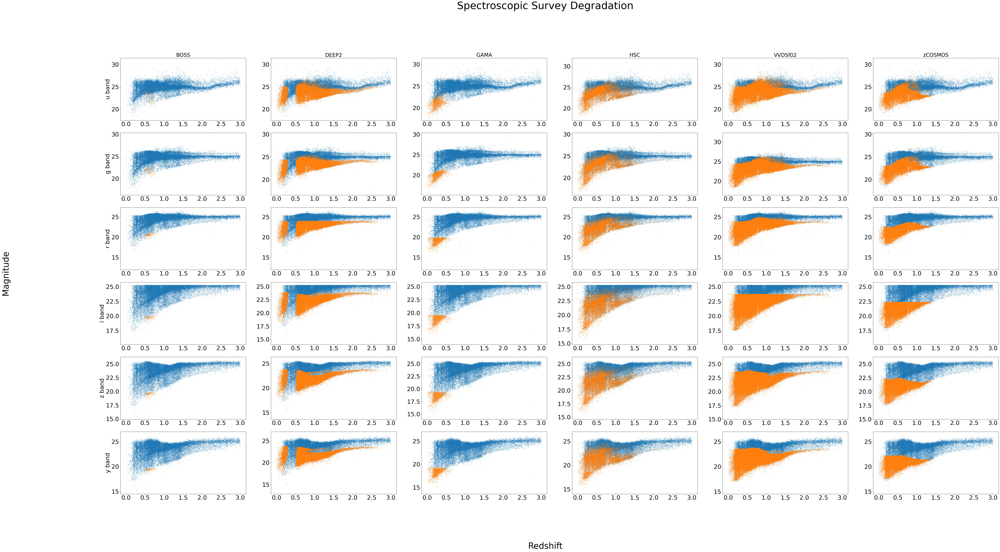

In [20]:
fig, axes = plt.subplots(nrows = 6, ncols = 6, figsize = (80, 40))

for i in range(0, 6):
    for j in range(0, 6):
        file = LSSTerr_only
        axes[i][j].scatter(file['redshift'], file[bands[i]], s=0.5)

for k in range(0, 6):
    deg = specs[k]
    file = getTrainFile(deg)
    for l in range(0, 6):
        axes[l][k].scatter(file['redshift'], file[bands[l]], s=0.5)


mpl.rcParams.update({'font.size':22})

for i in range(0, 6):
    axes[0][i].set_title(specs[i])

for i in range(0, 6):
    axes[i][0].set_ylabel(band_names[i])


mpl.rcParams.update({'font.size':30})

fig.supxlabel('Redshift', size = 'x-large')
fig.supylabel('Magnitude', size = 'x-large')
fig.suptitle('Spectroscopic Survey Degradation', size = 'xx-large')

Text(0.5, 0.98, 'Inverse Redshift Incompleteness Degradation')

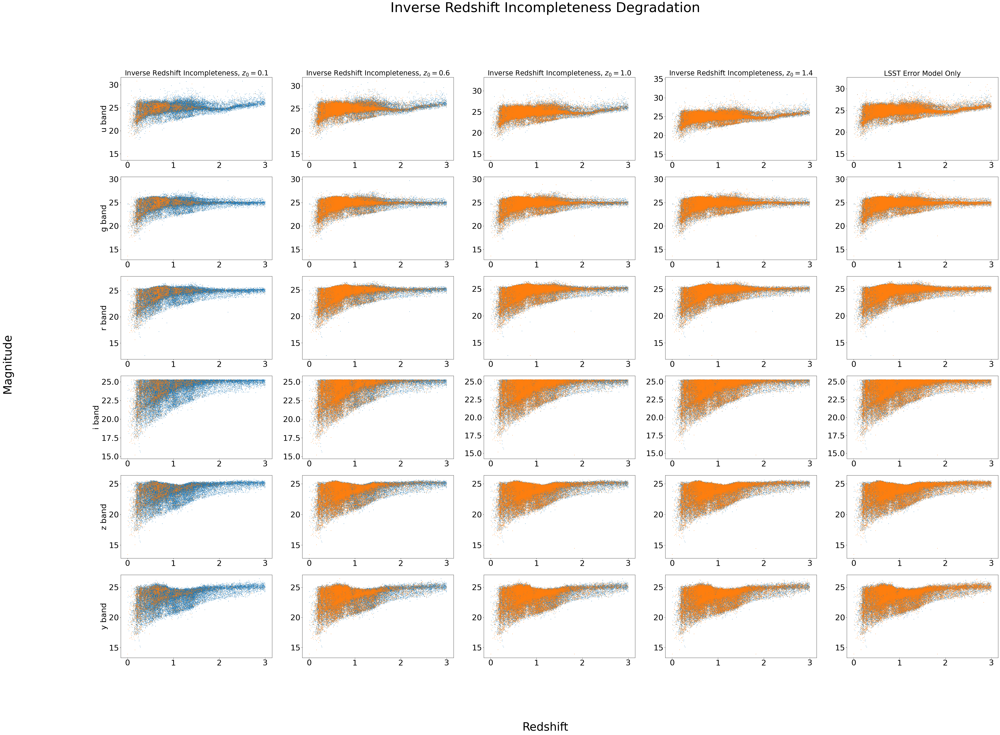

In [21]:
fig, axes = plt.subplots(nrows = 6, ncols = 5, figsize = (60, 40))

for i in range(0, 6):
    for j in range(0, 5):
        file = LSSTerr_only
        axes[i][j].scatter(file['redshift'], file[bands[i]], s=0.5)

for k in range(0, 5):
    deg = invz[k]
    file = getTrainFile(deg)
    for l in range(0, 6):
        axes[l][k].scatter(file['redshift'], file[bands[l]], s=0.5)


mpl.rcParams.update({'font.size':22})

for i in range(0, 5):
    axes[0][i].set_title(invz_names[i])

for i in range(0, 6):
    axes[i][0].set_ylabel(band_names[i])


mpl.rcParams.update({'font.size':30})

fig.supxlabel('Redshift', size = 'x-large')
fig.supylabel('Magnitude', size = 'x-large')
fig.suptitle('Inverse Redshift Incompleteness Degradation', size = 'xx-large')

/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/ipykernel_16759/2209644079.py:28: UserWarning: Legend does not support handles for QuadMesh instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  fig.legend()


Text(0.5, 0.98, 'Spectroscopic Survey Degradation')

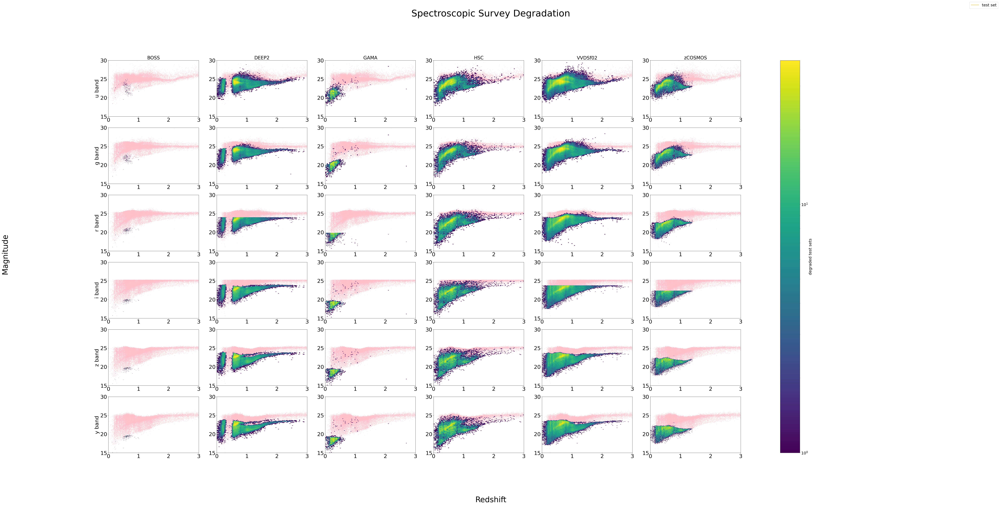

In [56]:
fig, axes = plt.subplots(nrows = 6, ncols = 6, figsize = (80, 40))

for i in range(0, 6):
    for j in range(0, 6):
        file = LSSTerr_only
        axes[i][j].scatter(file['redshift'], file[bands[i]], s=0.5, color = 'pink', alpha = 0.75)

for k in range(0, 6):
    deg = specs[k]
    file = removeNans(getTrainFile(deg), bands)
    for l in range(0, 6):
        h = axes[l][k].hist2d(file['redshift'], file[bands[l]], bins = 100, norm = mpl.colors.LogNorm(), label = 'degraded training sets' ) 
        axes[l][k].set_xlim(0, 3)
        axes[l][k].set_ylim(15, 30)


mpl.rcParams.update({'font.size':22})

axes[0][0].plot([], [], color = 'orange', label = 'test set')

for i in range(0, 6):
    axes[0][i].set_title(specs[i])

for i in range(0, 6):
    axes[i][0].set_ylabel(band_names[i])

fig.colorbar(h[3], ax=axes, label = 'degraded test sets')
fig.legend()

mpl.rcParams.update({'font.size':30})

fig.supxlabel('Redshift', size = 'x-large')
fig.supylabel('Magnitude', size = 'x-large')
fig.suptitle('Spectroscopic Survey Degradation', size = 'xx-large')

/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/ipykernel_16759/1932543721.py:28: UserWarning: Legend does not support handles for QuadMesh instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  fig.legend()


Text(0.5, 0.98, 'Inverse Redshift Incompleteness Survey Degradation')

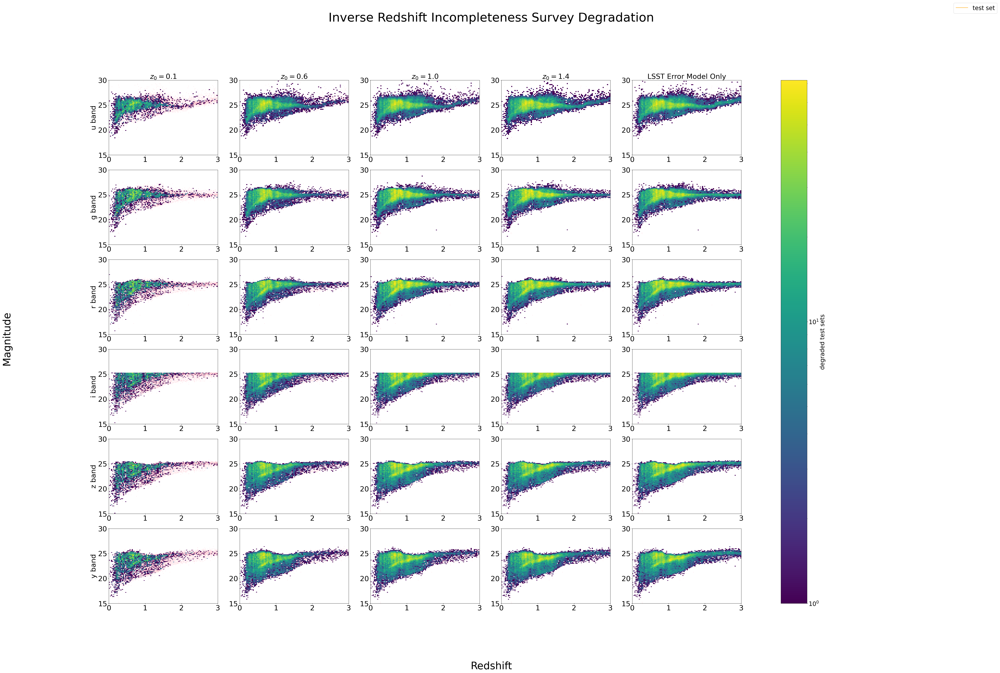

In [57]:
fig, axes = plt.subplots(nrows = 6, ncols = 5, figsize = (60, 40))

for i in range(0, 6):
    for j in range(0, 5):
        file = LSSTerr_only
        axes[i][j].scatter(file['redshift'], file[bands[i]], s=0.5, color = 'pink', alpha = 0.75)

for k in range(0, 5):
    deg = invz[k]
    file = removeNans(getTrainFile(deg), bands)
    for l in range(0, 6):
        h = axes[l][k].hist2d(file['redshift'], file[bands[l]], bins = 100, norm = mpl.colors.LogNorm(), label = 'degraded training sets' ) 
        axes[l][k].set_xlim(0, 3)
        axes[l][k].set_ylim(15, 30)


mpl.rcParams.update({'font.size':25})

axes[0][0].plot([], [], color = 'orange', label = 'test set')

for i in range(0, 5):
    axes[0][i].set_title(invz_names[i])

for i in range(0, 6):
    axes[i][0].set_ylabel(band_names[i])

fig.colorbar(h[3], ax=axes, label = 'degraded test sets')
fig.legend()

mpl.rcParams.update({'font.size':30})

fig.supxlabel('Redshift', size = 'x-large')
fig.supylabel('Magnitude', size = 'x-large')
fig.suptitle('Inverse Redshift Incompleteness Survey Degradation', size = 'xx-large')

# Visualizing Estimator Outputs 

# Distribution-to-distribution Statistics

In [244]:
def getStatsFile(est, stat):
    return pd.read_parquet('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/'+est+'/'+stat+'_stats.pq')

In [245]:
def makeStatHists(stat, deg, min, max, binnum, axes):

    import matplotlib.pyplot as plt
    import pandas as pd 
    
    grid = np.linspace(min, max, binnum)

    axes.hist(getStatsFile('TrainZ', stat)[deg], label = 'TrainZ', bins = grid, alpha = 0.5)
    axes.hist(getStatsFile('CMNN', stat)[deg], label = 'CMNN', bins = grid, alpha = 0.5)
    axes.hist(getStatsFile('GPz', stat)[deg], label = 'GPz', bins = grid, alpha = 0.5)
    axes.hist(getStatsFile('FZBoost', stat)[deg], label = 'FZBoost', bins = grid, alpha = 0.5)
    axes.hist(getStatsFile('PZFlow', stat)[deg], label = 'PZFlow', bins = grid, alpha = 0.5)
        
    axes.legend()
    #axes.set_xlim(min, max)
    #axes.set_xscale('log')
    #axes.set_yscale('log')
    #axes.ylim(0, 10000)
    
    axes.set_title(stat)

In [407]:
# choose training set degradation by setting trainset = [desired training data]
# note: I will make the titles look nicer once we're ready to choose which plots to go in the paper! 

trainset = 'BOSS'

Text(0.5, 0.98, 'Distribution of statistic values for LSSTerr_only training set')

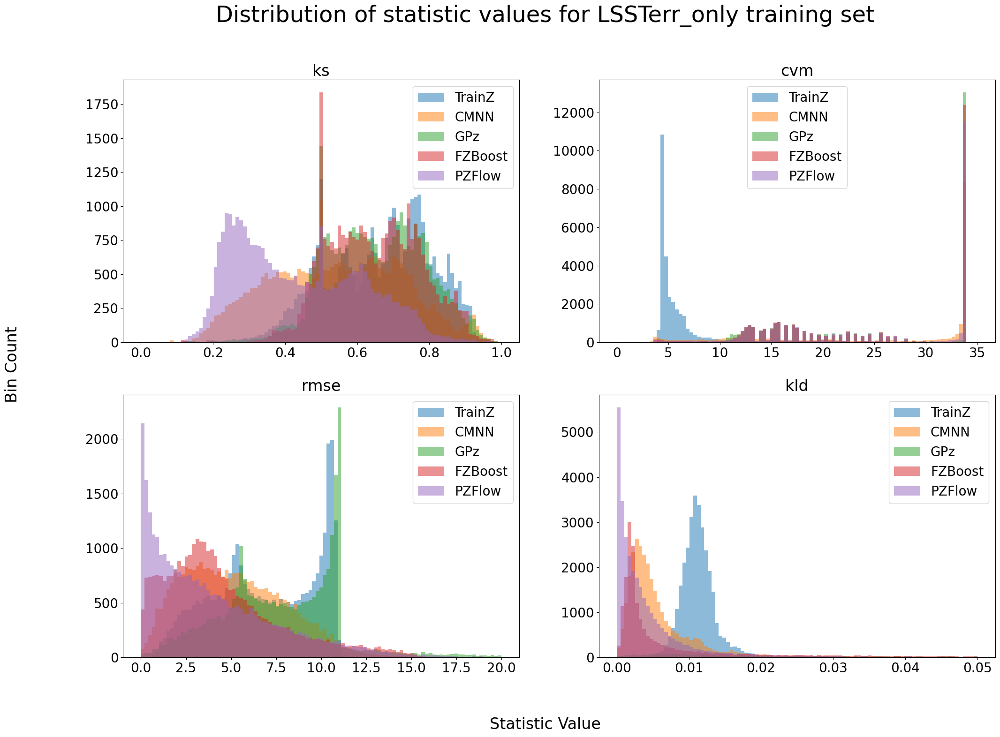

In [303]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (24, 16) )


makeStatHists('ks', trainset, 0, 1, 100, axes[0][0])
makeStatHists('cvm', trainset, 0, 35, 100, axes[0][1])
makeStatHists('rmse', trainset, 0, 20, 100, axes[1][0])
makeStatHists('kld', trainset, 0, 0.05, 100, axes[1][1])


fig.supxlabel('Statistic Value')
fig.supylabel('Bin Count')
fig.suptitle("Distribution of statistic values for "+trainset+" training set", size = 'xx-large')

In [304]:
def makeLogStatHists(stat, deg, binnum, axes):

    axes.hist(np.log(getStatsFile('TrainZ', stat)[deg]), label = 'TrainZ', bins = binnum, alpha = 0.3)
    axes.hist(np.log(getStatsFile('CMNN', stat)[deg]), label = 'CMNN', bins = binnum, alpha = 0.3)
    axes.hist(np.log(getStatsFile('GPz', stat)[deg]), label = 'GPz', bins = binnum, alpha = 0.3)
    axes.hist(np.log(getStatsFile('FZBoost', stat)[deg]), label = 'FZBoost', bins = binnum, alpha = 0.3)
    axes.hist(np.log( removeNans(getStatsFile('PZFlow', stat), [deg] ))[deg], label = 'PZFlow', bins = binnum, alpha = 0.3)
        
    axes.legend()
    #axes.set_xlim(min, max)
    #axes.set_xscale('log')
    axes.set_yscale('log')
    #axes.ylim(0, 10000)
    
    axes.set_title(stat)

Text(0.5, 0.98, 'Distribution of statistic values for LSSTerr_only training set')

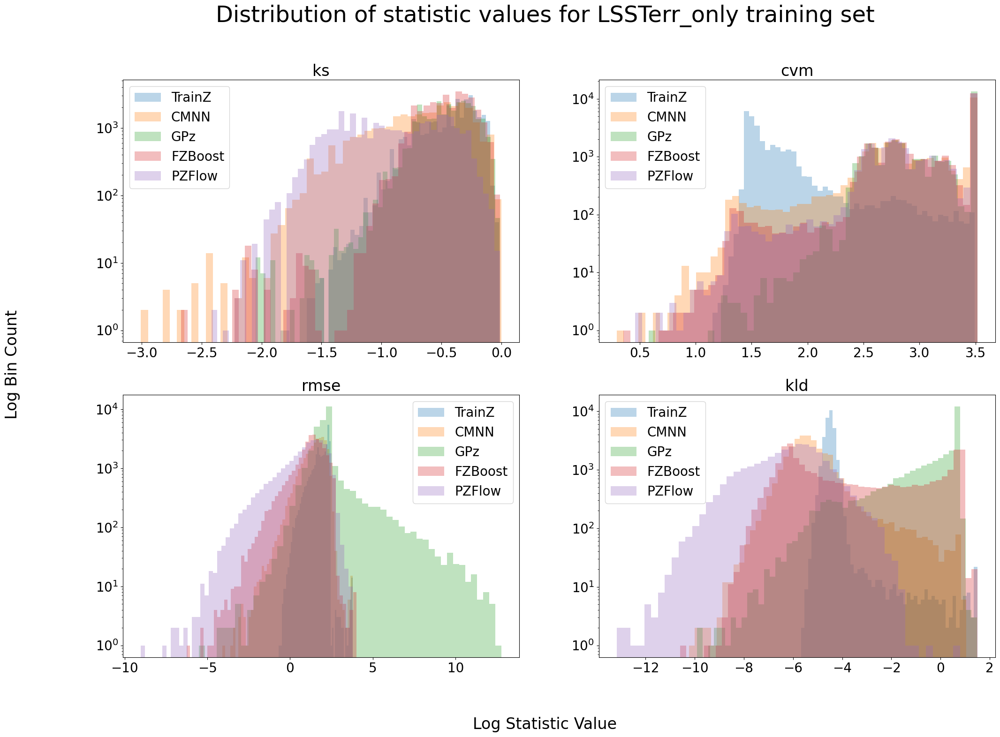

In [305]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (24, 16) )


makeLogStatHists('ks', trainset, 50, axes[0][0])
makeLogStatHists('cvm', trainset, 50, axes[0][1])
makeLogStatHists('rmse', trainset, 50, axes[1][0])
makeLogStatHists('kld', trainset, 50, axes[1][1])


fig.supxlabel('Log Statistic Value')
fig.supylabel('Log Bin Count')
fig.suptitle("Distribution of statistic values for "+trainset+" training set", size = 'xx-large')

In [516]:
def helpLogPlots(deg, stat, grid):
    t = plt.hist(getStatsFile('TrainZ', stat)[deg], bins = grid, color = 'white')
    c = plt.hist(getStatsFile('CMNN', stat)[deg], bins = grid, color = 'white')
    g = plt.hist(getStatsFile('GPz', stat)[deg], bins = grid, color = 'white')
    f = plt.hist(getStatsFile('FZBoost', stat)[deg], bins = grid, color = 'white')
    p = plt.hist(removeNans(getStatsFile('PZFlow', stat),[deg])[deg] , bins = grid, color = 'white')
    return (t[0], t[1]), (c[0], c[1]), (g[0], g[1]), (f[0], f[1]), (p[0], p[1])

In [532]:
def makeLogStatPlots(stat, deg, grid, axes):

    # t = plt.hist(getStatsFile('TrainZ', stat)[deg], bins = grid, color = 'white')
    # c = plt.hist(getStatsFile('CMNN', stat)[deg], bins = grid, color = 'white')
    # g = plt.hist(getStatsFile('GPz', stat)[deg], bins = grid, color = 'white')
    # f = plt.hist(getStatsFile('FZBoost', stat)[deg], bins = grid, color = 'white')
    # p = plt.hist(removeNans(getStatsFile('PZFlow', stat),[deg])[deg] , bins = grid, color = 'white')
    t, c, g, f, p = helpLogPlots(deg, stat, grid)
    #plt.show()

    tx = t[1].tolist()
    tx.pop(-1)
    cx = c[1].tolist()
    cx.pop(-1)
    gx = g[1].tolist()
    gx.pop(-1)
    fx = f[1].tolist()
    fx.pop(-1)
    px = p[1].tolist()
    px.pop(-1)

    td = []
    cd = []
    gd = []
    fd = []
    pd = []

    val = 0
    for i in t[0]: 
        val += i
        td.append(val)
    td = td/np.sum(t[0])

    val = 0
    for i in c[0]: 
        val += i
        cd.append(val)
    cd = cd/np.sum(c[0])    
    
    val = 0
    for i in g[0]: 
        val += i
        gd.append(val)
    gd = gd/np.sum(g[0])

    val = 0
    for i in f[0]: 
        val += i
        fd.append(val)
    fd = fd/np.sum(f[0])

    val = 0
    for i in p[0]: 
        val += i
        pd.append(val)
    pd = pd/np.sum(p[0])

    axes.plot(np.asarray(tx) + (tx[1] - tx[0])/2, td, label = 'TrainZ')
    axes.plot(np.asarray(cx) + (cx[1] - cx[0])/2, cd, label = 'CMNN')
    axes.plot(np.asarray(gx) + (gx[1] - gx[0])/2, gd, label = 'GPz')
    axes.plot(np.asarray(fx) + (fx[1] - fx[0])/2, fd, label = 'FZBoost')
    axes.plot(np.asarray(px) + (px[1] - px[0])/2,  pd, label = 'PZFlow')
        
    axes.legend()
    #axes.set_xlim(min, max)
    #axes.set_xscale('log')
    axes.set_yscale('log')
    #axes.set_ylim(0, 1e5)
    
    axes.set_title(stat)

In [533]:
trainset = 'LSSTerr_only'

Text(0.5, 0.98, 'Quantile plots of statistic values for LSSTerr_only training set')

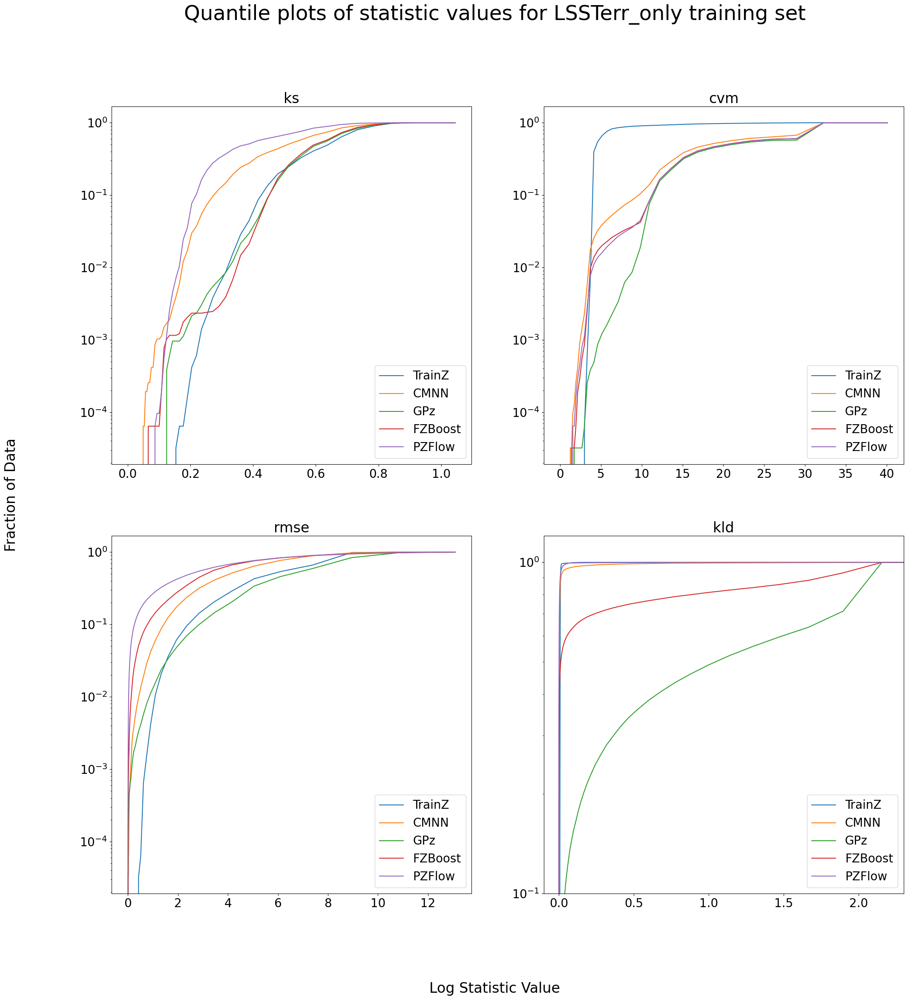

In [531]:
fig, axes = plt.subplots(nrows = 2, ncols = 2, figsize = (24, 24) )


makeLogStatPlots('ks', trainset, np.logspace(-3, 0.05, 100), axes[0][0])
makeLogStatPlots('cvm', trainset, np.logspace(-3, 1.65, 100), axes[0][1])
makeLogStatPlots('rmse', trainset, np.logspace(-7, 1.2, 100), axes[1][0])
makeLogStatPlots('kld', trainset, np.logspace(-5, 0.5, 100), axes[1][1])
axes[1][1].set_xlim(-0.1, 2.3)
axes[1][1].set_ylim(1e-1, 10**(0.08))

fig.supxlabel('Log Statistic Value')
fig.supylabel('Fraction of Data')
fig.suptitle("Quantile plots of statistic values for "+trainset+" training set", size = 'xx-large')

In [ ]:
fig, axes = plt.subplots(nrows = 1, ncols = 1, figsize = (24, 24) )


makeLogStatPlots('ks', trainset, np.logspace(-3, 0.05, 100), axes[0][0])
makeLogStatPlots('cvm', trainset, np.logspace(-3, 1.65, 100), axes[0][1])
makeLogStatPlots('rmse', trainset, np.logspace(-7, 1.2, 100), axes[1][0])
makeLogStatPlots('kld', trainset, np.logspace(-5, 0.5, 100), axes[1][1])
axes[1][1].set_xlim(-0.1, 2.3)
axes[1][1].set_ylim(1e-1, 10**(0.08))

Text(0.5, 1.0, 'GPz outputs, training set: inverse redshift incompleteness, $z_0 = 0.1$')

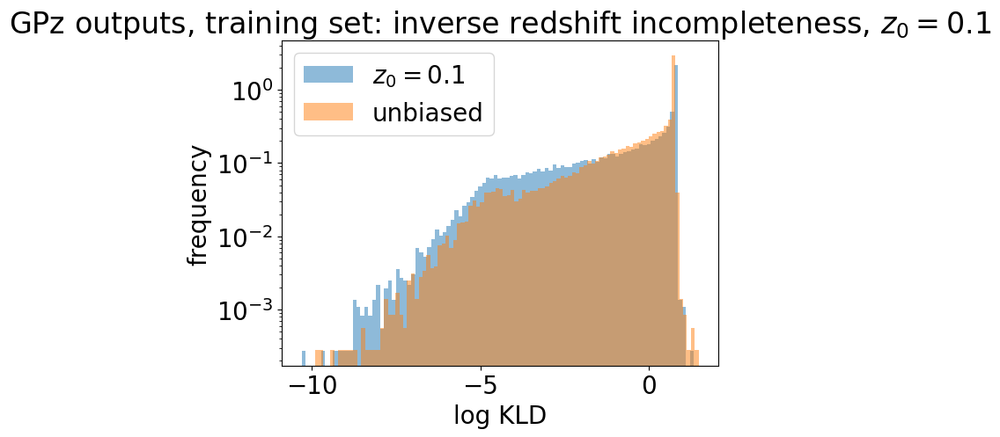

In [428]:
plt.hist(np.log(getStatsFile('GPz', 'kld')['invz=0.1']), density = True, bins = 100, alpha = 0.5, label = '$z_0=0.1$')
#plt.hist(np.log(getStatsFile('GPz', 'kld')['invz=0.6']), density = True, bins = 100, alpha = 0.5, label = '0.6')
#plt.hist(np.log(getStatsFile('GPz', 'kld')['invz=1.0']), density = True, bins = 100, alpha = 0.5, label = '1.0')
#plt.hist(np.log(getStatsFile('GPz', 'kld')['invz=1.4']), density = True, bins = 100, alpha = 0.5, label = '1.4')
plt.hist(np.log(getStatsFile('GPz', 'kld')['LSSTerr_only']), density = True, bins = 100, alpha = 0.5, label = 'unbiased')
plt.legend()
plt.xlabel('log KLD')
plt.ylabel('frequency')
plt.yscale('log')
plt.title("GPz outputs, training set: inverse redshift incompleteness, $z_0 = 0.1$")

# Point-to-distribution Statistics

## CDE Loss

In [447]:
# Table of CDE Loss values 
pd.read_parquet('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/CDE_loss.pq')

,TrainZ,CMNN,GPz,FZBoost,PZFlow
BOSS,-0.442022,0.321145,3.200435e+00,1.506690,23.886964
DEEP2,-0.547189,-5.677323,5.030364e+02,2.583252,-2.646332
GAMA,2.114907,-0.130835,3.176437e+00,9.752169,-0.571163
HSC,-0.254122,-6.544985,7.936371e+02,-4.241024,-8.677972
VVDSf02,-0.405315,-8.094685,7.493797e+02,-1.765739,-5.883014
zCOSMOS,-0.102386,-4.525471,2.606405e+02,4.684927,-9.638280
invz=0.1,-0.442022,-5.302773,6.394174e+02,-8.023600,-9.047620
invz=0.6,-0.547189,-7.162863,7.694185e+02,-8.755032,-12.782948
invz=1.0,-0.601578,-7.300487,8.732208e+02,-8.941378,-12.858271
invz=1.4,-0.614322,-7.169733,7.703104e+02,-9.026900,-13.289037


In [436]:
GPz_CDE = pd.read_parquet('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/CDE_loss.pq')['GPz']
GPz_CDE

BOSS             3.200435e+00
DEEP2            5.030364e+02
GAMA             3.176437e+00
HSC              7.936371e+02
VVDSf02          7.493797e+02
zCOSMOS          2.606405e+02
invz=0.1         6.394174e+02
invz=0.6         7.694185e+02
invz=1.0         8.732208e+02
invz=1.4         7.703104e+02
LSSTerr_only     7.454152e+02
LSSTerr_null   -5.195812e-240
Name: GPz, dtype: float64

/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/ipykernel_16759/232487960.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  data = GPz_CDE[6]
/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/ipykernel_16759/232487960.py:2: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.scatter([0.1, 0.6, 1.0, 1.4], [GPz_CDE[6], GPz_CDE[7],GPz_CDE[8],GPz_CDE[9]], label = 'inverse redshift incompleteness')
/var/folders/jl/5jxwvx_x5q364l56c4qph1g00000gn/T/ipykernel_16759/232487960.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (co

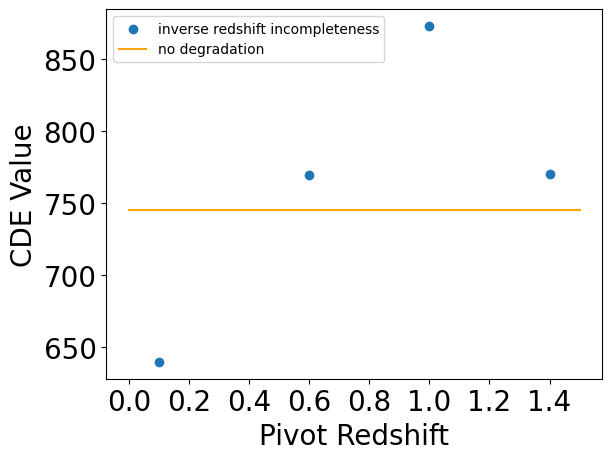

In [443]:
data = GPz_CDE[6]
plt.scatter([0.1, 0.6, 1.0, 1.4], [GPz_CDE[6], GPz_CDE[7],GPz_CDE[8],GPz_CDE[9]], label = 'inverse redshift incompleteness') 
plt.plot(np.linspace(0, 1.5, 3), GPz_CDE[10]*np.ones(3), color = 'orange', label = 'no degradation')
mpl.rcParams.update({'font.size':10})
plt.xlabel('Pivot Redshift')
plt.ylabel('CDE Value')
plt.legend()

## PIT

In [456]:
def getPITFile(est):
    return pd.read_parquet('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/'+est+'/PIT.pq')

In [496]:
est = 'GPz'
deg = 'invz=0.1'

# I've put the y-axis on a log scale; otherwise the spikes on the sides are too large to see the rest of the distribution

Text(0.5, 1.0, 'Probability Integral Transform Distribution for GPz with invz=0.1 Training Data')

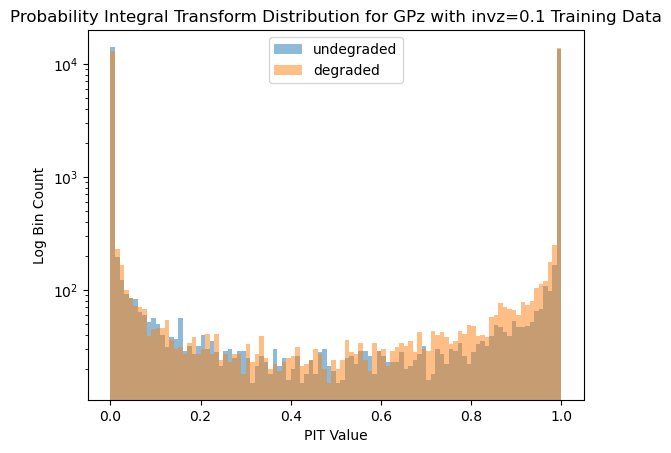

In [505]:
plt.hist(getPITFile(est)['LSSTerr_only'], bins = 100, alpha=0.5, label = 'undegraded')#, density = True)
plt.hist(removeNans(getPITFile(est), [deg])[deg], bins = 100, alpha=0.5, label = 'degraded')#, density = True)

x = np.linspace(0, 1, 100)
#plt.plot(x, sts.uniform.pdf(x), label = 'Uniform Distribution')
plt.yscale('log')
plt.legend()
plt.xlabel("PIT Value")
plt.ylabel('Log Bin Count')
plt.title('Probability Integral Transform Distribution for '+est+' with '+deg+' Training Data')

# Mean Point Estimates

In [538]:
pd.read_parquet('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/outlier_rejection.pq')
# Outlier Rejection statistics on mode data

,TrainZ,CMNN,GPz,FZBoost,PZFlow
BOSS,0.0%,0.0%,0.0%,0.0%,0.0%
DEEP2,0.0%,3.571%,0.051%,2.819%,0.072%
GAMA,0.0%,0.0%,0.0%,0.0%,0.357%
HSC,0.0%,2.537%,2.182%,2.051%,2.123%
VVDSf02,0.0%,3.331%,0.099%,2.857%,1.243%
zCOSMOS,0.0%,0.0%,0.0%,0.0%,2.795%
invz=0.1,0.0%,1.846%,2.006%,2.323%,2.056%
invz=0.6,0.0%,1.459%,2.253%,1.494%,1.361%
invz=1.0,0.0%,1.664%,2.096%,1.414%,1.217%
invz=1.4,0.0%,1.644%,2.009%,1.328%,1.140%


In [309]:
def getModesFile(est):
    return pd.read_parquet('/Users/alicec03/Desktop/Summer_Research/Photo-z-Stress-Test/Photo-z-Stress-Test/'+est+'/modes.pq')

In [514]:
# choose which training set degradation condition you're plotting by setting deg = [degrader]
# options are in deg_ls

deg = 'invz=0.1'

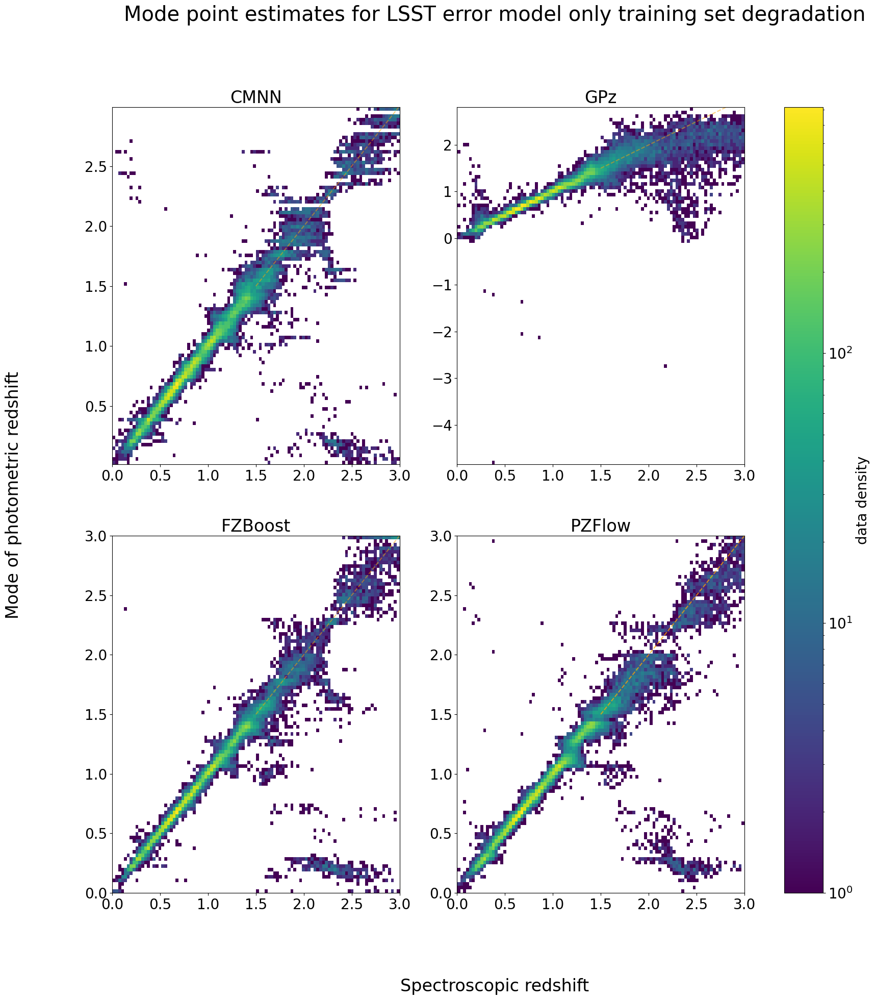

In [535]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize = (20, 20) )

line = np.linspace(1.5, 3, 101)

mpl.rcParams.update({'font.size':20})

m = axes[0][0].hist2d(getModesFile('CMNN')['redshift'], getModesFile('CMNN')[deg], bins = 100, norm = mpl.colors.LogNorm())
axes[0][0].plot(line, line, color = 'orange', linestyle = 'dashed', alpha = 0.5)
axes[0][0].set_title('CMNN')
axes[0][0].set_xlim(0, 3)
#axes[0][0].set_ylim(0, 3)

n = axes[0][1].hist2d(getModesFile('GPz')['redshift'], getModesFile('GPz')[deg], bins = 100, norm = mpl.colors.LogNorm())
axes[0][1].plot(line, line, color = 'orange', linestyle = 'dashed', alpha = 0.5)
axes[0][1].set_title('GPz')
axes[0][1].set_xlim(0, 3)
#axes[0][1].set_ylim(0, 3)

h = axes[1][0].hist2d(getModesFile('FZBoost')['redshift'], getModesFile('FZBoost')[deg], bins = 100, norm = mpl.colors.LogNorm())
axes[1][0].plot(line, line, color = 'orange', linestyle = 'dashed', alpha = 0.5)
axes[1][0].set_title('FZBoost')
axes[1][0].set_xlim(0, 3)
#axes[1][0].set_ylim(0, 3)

inds = []
z = []
data = []
pzfdata = getModesFile('PZFlow')[deg].tolist()
ct = 0
for i in pzfdata:
    if np.isnan(i)==False: 
        data.append(i)
        inds.append(ct)
    ct += 1

ct2 = 0
for j in getModesFile('PZFlow')['redshift']:
    if ct2 in inds: 
        z.append(j)
    ct2 += 1

axes[1][1].hist2d(z, data, bins = 100, norm = mpl.colors.LogNorm())
axes[1][1].plot(line, line, color = 'orange', linestyle = 'dashed', alpha=0.75)
axes[1][1].set_title('PZFlow')
axes[1][1].set_xlim(0, 3)
#axes[1][1].set_ylim(0, 3)


fig.suptitle("Mode point estimates for LSST error model only training set degradation", size = 'x-large')
fig.supxlabel('Spectroscopic redshift')
fig.supylabel('Mode of photometric redshift')
fig.colorbar(n[3], ax=axes, label = 'data density')